# Forward Projection (simple draft demo)

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import easyidp as idp

In [2]:
fb = idp.data.ForestBirds()

dom = idp.GeoTiff(fb.metashape.dom)
dsm = idp.GeoTiff(fb.metashape.dsm)
dsm.header["crs"]

Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)
Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Then check the shp columns, name using \[id\] as the key of ROI

In [3]:
idp.shp.show_shp_fields(fb.shp)

  [-1]   [0] id     [1] left       [2] top         [3] right        [4] bottom
------  --------  -------------  ------------  ------------------  ------------
     0     23     -80.839574347  25.783543637  -80.83947434699999  25.783443637
     1     24     -80.839574347  25.783443637  -80.83947434699999  25.783343637
     2     25     -80.839574347  25.783343637  -80.83947434699999  25.783243637
   ...    ...          ...           ...              ...              ...
   175    244     -80.838374347  25.783043637    -80.838274347     25.782943637
   176    245     -80.838374347  25.782943637    -80.838274347     25.782843637
   177    246     -80.838374347  25.782843637    -80.838274347     25.782743637


In [4]:
grid = idp.ROI(fb.shp, name_field="id")
grid.get_z_from_dsm(fb.metashape.dsm)
grid.keys()

[shp][proj] Use projection [WGS 84] for loaded shapefile [Hidden_Little_grid.shp]


Read shapefile [Hidden_Little_grid.shp]: 100%|██████████| 178/178 [00:00<00:00, 1566.40it/s]


Could not find prefered [GTCitationGeoKey, PCSCItationGeoKey], but find [GeogCitationGeoKey]=WGS 84 instead for Coordinate Reference System (CRS)


Read z values of roi from DSM [Hidden_Little_03_24_2022_DEM.tif]: 100%|██████████| 178/178 [00:02<00:00, 75.49it/s]


dict_keys(['23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '158', '159', '160', '161', '164', '165', '166', '167', '168', '169', '170', '171', '172', '173', '174', '175', '176', '177', '178', '184', '185', '186', '187', '188', '189', '190', '191', '192', '193', '194', '195', '196', '202', '203

In [5]:
grid["23"]

array([[-80.83957435,  25.78354364, -37.19462204],
       [-80.83947435,  25.78354364, -37.19462204],
       [-80.83947435,  25.78344364, -37.19462204],
       [-80.83957435,  25.78344364, -37.19462204],
       [-80.83957435,  25.78354364, -37.19462204]])

Check the results of DOM grid

In [6]:
dom_parts = grid.crop(dom)
dom_parts.keys()

Crop roi from geotiff [Hidden_Little_03_24_2022.tiff]: 100%|██████████| 178/178 [01:19<00:00,  2.24it/s]


dict_keys(['23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', '157', '158', '159', '160', '161', '164', '165', '166', '167', '168', '169', '170', '171', '172', '173', '174', '175', '176', '177', '178', '184', '185', '186', '187', '188', '189', '190', '191', '192', '193', '194', '195', '196', '202', '203

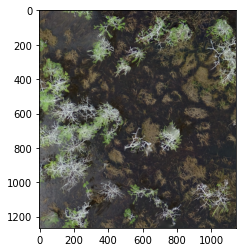

In [7]:
plt.imshow(dom_parts["23"])

Check by QGIS:

<img width="243" alt="Snipaste_2022-09-10_13-01-25" src="https://user-images.githubusercontent.com/19968935/189467936-d85cc4ed-f37c-4cc7-b221-73b3d45587ca.png">

backward projection to raw images

In [8]:
ms = idp.Metashape(fb.metashape.project, chunk_id=0)

In [9]:
ms._world_crs

<Geocentric CRS: +proj=geocent +ellps=WGS84 +datum=WGS84 +type=crs>
Name: unknown
Axis Info [cartesian]:
- X[geocentricX]: Geocentric X (metre)
- Y[geocentricY]: Geocentric Y (metre)
- Z[geocentricZ]: Geocentric Z (metre)
Area of Use:
- undefined
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [10]:
grid_raw = ms.back2raw(grid)
grid_raw["136"]

Backward roi to raw images: 100%|██████████| 178/178 [00:00<00:00, 322.25it/s]


{'DJI_0149': array([[2155.76274299, 1292.00630554],
        [ 931.28560264, 1265.38057764],
        [1027.53614317,   48.84011073],
        [2202.13457101,   77.25924616],
        [2155.76274299, 1292.00630554]]),
 'DJI_0150': array([[2122.97474143, 2470.15042821],
        [ 854.29237108, 2446.08253122],
        [ 957.31234722, 1138.48305458],
        [2172.36952834, 1164.85229968],
        [2122.97474143, 2470.15042821]]),
 'DJI_0151': array([[2102.29461967, 3689.72305177],
        [ 785.90342263, 3670.08548398],
        [ 894.07845967, 2261.49576956],
        [2153.18820651, 2284.03034259],
        [2102.29461967, 3689.72305177]]),
 'DJI_0164': array([[4424.2693763 , 3391.92746052],
        [3140.88487962, 3389.12587973],
        [3126.90861361, 2019.1609286 ],
        [4354.31777474, 2027.11677147],
        [4424.2693763 , 3391.92746052]]),
 'DJI_0165': array([[4330.00675909, 2243.13594271],
        [3094.20946698, 2234.45696699],
        [3083.72318543,  963.19100549],
        [426

Then find the closest raw image

In [11]:
closest_img = ms.sort_img_by_distance(grid_raw, grid, num=1)
closest_img

Filter by distance to ROI: 100%|██████████| 178/178 [00:00<00:00, 22255.59it/s]


{'23': {'DJI_0110': array([[4884.68152518, 3095.84285985],
         [3702.95435122, 3016.65312445],
         [3756.99308865, 1761.90670177],
         [4896.57926407, 1836.44369074],
         [4884.68152518, 3095.84285985]])},
 '24': {'DJI_0111': array([[4958.42321981, 2902.33882923],
         [3771.91294596, 2823.6634423 ],
         [3823.26373779, 1571.07899478],
         [4967.37488698, 1644.97628242],
         [4958.42321981, 2902.33882923]])},
 '25': {'DJI_0113': array([[5033.9461918 , 3876.03105176],
         [3809.99746357, 3796.78902349],
         [3858.24706776, 2470.36765309],
         [5036.95477867, 2544.71744768],
         [5033.9461918 , 3876.03105176]])},
 '26': {'DJI_0114': array([[5069.5250545 , 3697.38791571],
         [3851.02558866, 3620.93264295],
         [3895.6527072 , 2306.11041762],
         [5069.71275015, 2377.77288097],
         [5069.5250545 , 3697.38791571]])},
 '27': {'DJI_0115': array([[5125.13055429, 3529.40353136],
         [3914.63508842, 3456.8860169

Check the ROI on the DOM and on the raw respectively.

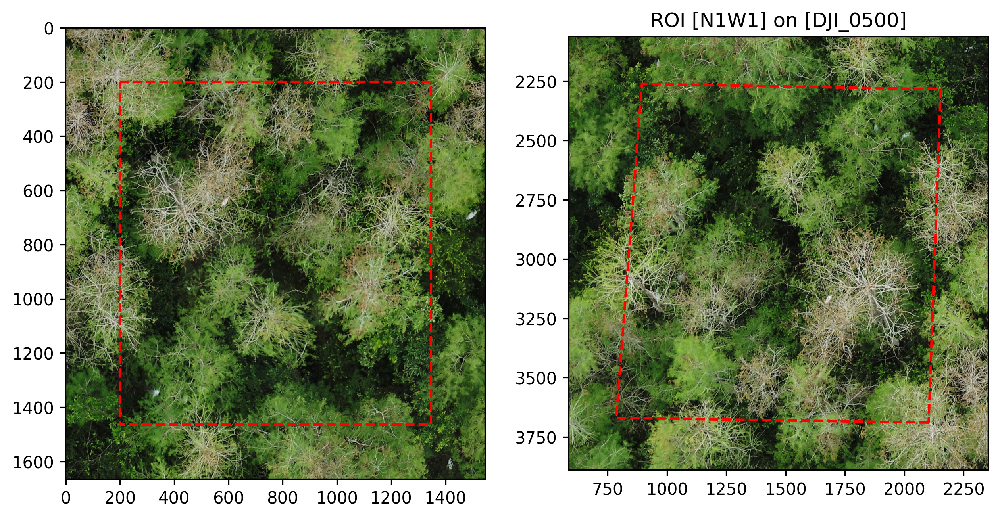

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6), dpi=300)

# draw roi on dom
buffer = 200 # pixel
## perpare cropped dom in pixel with buffer
grid_coord = idp.geotiff.geo2pixel(grid["136"], dom.header, return_index=True)
dom_xmin, dom_ymin = grid_coord.min(axis=0)
dom_xmax, dom_ymax = grid_coord.max(axis=0)
dom_grid_crop = dom.crop_rectangle(
    left = dom_xmin-buffer, 
    top = dom_ymin-buffer, 
    w=dom_xmax - dom_xmin + buffer * 2, 
    h=dom_ymax - dom_ymin + buffer * 2, 
    is_geo=False   # this is pixel coordinate on dom
)
ax[0].imshow(dom_grid_crop)
offset_coord = grid_coord - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax[0].plot(*offset_coord.T, '--r')

# draw roi on raw
photo_name = list(closest_img["136"].keys())[0]  # find the cloest image name
photo_path = ms.photos[photo_name].path   # -> e:\\Inspire Raw Data\\Hidden_Little\\Hidden_Little_03_24_2022\\DJI_0151.JPG
# I need to replace the photo path here to run
photo_path = photo_path.replace("Inspire Raw Data\\Hidden_Little\\", "easyidp.data\\2022_florida_forestbirds\\")
img_np = plt.imread(photo_path)
img_coord = closest_img["136"][photo_name]
im_xmin, im_ymin = img_coord.min(axis=0)
im_xmax, im_ymax = img_coord.max(axis=0)

ax[1].imshow(img_np)
ax[1].plot(*img_coord.T, '--r')
ax[1].set_xlim(im_xmin-buffer, im_xmax+buffer)
ax[1].set_ylim(im_ymin-buffer, im_ymax+buffer)
ax[1].invert_yaxis()
ax[1].set_title(f"ROI [N1W1] on [DJI_0500]")

plt.show()

For example, you detect the results on DJI_0500 is 

In [13]:
bbox = {
    "bird1": [1650, 3200, 50, 50],  #horizontal, vertical, width, height
    "bird2": [1980, 2500, 45, 40]
}

Then check the bbox on the raw:

In [14]:
def bbox2coord(bbox):
    horizontal, vertical, width, height = bbox

    out = np.array([
        [horizontal, vertical],
        [horizontal, vertical-height],
        [horizontal+width, vertical-height],
        [horizontal+width, vertical],
        [horizontal, vertical],
    ])

    return out

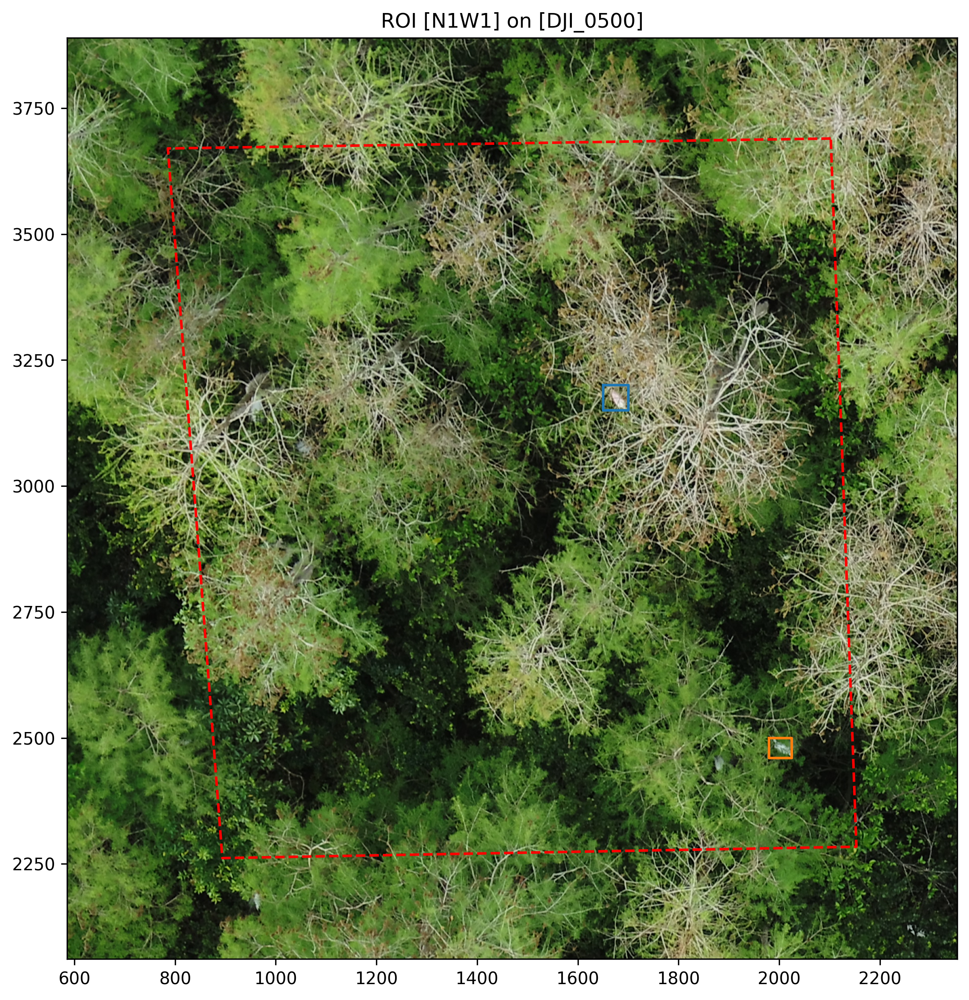

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=300)

ax.imshow(img_np)
ax.plot(*img_coord.T, '--r')

# bbox
for k, v in bbox.items():
    bb = bbox2coord(v)
    ax.plot(*bb.T)

ax.set_xlim(im_xmin-buffer, im_xmax+buffer)
ax.set_ylim(im_ymin-buffer, im_ymax+buffer)
ax.set_title(f"ROI [N1W1] on [DJI_0500]")

plt.show()

Then calculate the inverse transform matrix from raw to DOM:

In [16]:
from skimage.transform import ProjectiveTransform

In [17]:
print("ROI pixel coords on DOM")
print(grid_coord, "\n")
print("ROI pixel coords on the raw image")
print(img_coord)

ROI pixel coords on DOM
[[ 8017 11386]
 [ 9163 11386]
 [ 9163 12651]
 [ 8017 12651]
 [ 8017 11386]] 

ROI pixel coords on the raw image
[[2102.29461967 3689.72305177]
 [ 785.90342263 3670.08548398]
 [ 894.07845967 2261.49576956]
 [2153.18820651 2284.03034259]
 [2102.29461967 3689.72305177]]


In [18]:
pt = ProjectiveTransform()
pt.estimate(grid_coord, img_coord)

dom_bbox_px = {}
dom_bbox_lonlat = {}
for k, v in bbox.items():
    bb = bbox2coord(v)
    out = pt.inverse(bb)
    dom_bbox_px[k] = out
    dom_bbox_lonlat[k] = idp.geotiff.pixel2geo(out, dom.header)


In [19]:
dom_bbox_px

{'bird1': array([[ 8432.87476192, 11807.44010975],
        [ 8435.12747078, 11851.79484565],
        [ 8390.8677755 , 11852.5077475 ],
        [ 8388.68369089, 11808.14610682],
        [ 8432.87476192, 11807.44010975]]),
 'bird2': array([[ 8166.70950679, 12446.58103703],
        [ 8168.21329372, 12483.69281122],
        [ 8127.43583926, 12484.42522301],
        [ 8125.98384556, 12447.30805059],
        [ 8166.70950679, 12446.58103703]])}

In [20]:
dom_bbox_lonlat

{'bird1': array([[-80.83893812,  25.78301034],
        [-80.83893792,  25.78300683],
        [-80.83894178,  25.78300678],
        [-80.83894197,  25.78301028],
        [-80.83893812,  25.78301034]]),
 'bird2': array([[-80.83896135,  25.78295982],
        [-80.83896122,  25.78295689],
        [-80.83896478,  25.78295683],
        [-80.83896491,  25.78295976],
        [-80.83896135,  25.78295982]])}

Preview the results on DOM:

<function matplotlib.pyplot.show(close=None, block=None)>

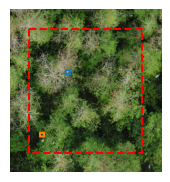

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(2, 2), dpi=96)

ax.imshow(dom_grid_crop)
offset_coord = grid_coord - np.array([dom_xmin-buffer, dom_ymin-buffer])
ax.plot(*offset_coord.T, '--r')

for k, v in dom_bbox_px.items():
    bb = v - np.array([dom_xmin-buffer, dom_ymin-buffer])
    ax.plot(*bb.T)

plt.axis('off')
plt.tight_layout()
plt.show